Import + Load Data

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,5))

# upload CSV manually in Colab
df = pd.read_csv("ai_job_dataset.csv")

df.head()


,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
0,AI00001,AI Research Scientist,90376,USD,SE,CT,China,M,China,50,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9,Automotive,2024-10-18,2024-11-07,1076,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895,USD,EN,CT,Canada,M,Ireland,100,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1,Media,2024-11-20,2025-01-11,1268,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626,USD,MI,FL,Switzerland,L,South Korea,0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2,Education,2025-03-18,2025-04-07,1974,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215,USD,SE,FL,India,M,India,50,"Scala, SQL, Linux, Python",PhD,7,Consulting,2024-12-23,2025-02-24,1345,8.6,Future Systems
4,AI00005,AI Consultant,54624,EUR,EN,PT,France,S,Singapore,100,"MLOps, Java, Tableau, Python",Master,0,Media,2025-04-15,2025-06-23,1989,6.6,Advanced Robotics


<Figure size 1000x500 with 0 Axes>

Basic Cleaning

In [ ]:
# convert posting_date to datetime
df['posting_date'] = pd.to_datetime(df['posting_date'], dayfirst=False)

# drop missing values
df = df.dropna(subset=['job_title', 'company_location', 'posting_date'])

# standardize text
df['job_title'] = df['job_title'].str.lower().str.strip()
df['company_location'] = df['company_location'].str.strip()

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   job_id                  15000 non-null  object        
 1   job_title               15000 non-null  object        
 2   salary_usd              15000 non-null  int64         
 3   salary_currency         15000 non-null  object        
 4   experience_level        15000 non-null  object        
 5   employment_type         15000 non-null  object        
 6   company_location        15000 non-null  object        
 7   company_size            15000 non-null  object        
 8   employee_residence      15000 non-null  object        
 9   remote_ratio            15000 non-null  int64         
 10  required_skills         15000 non-null  object        
 11  education_required      15000 non-null  object        
 12  years_experience        15000 non-null  int64 

Creating time columns

In [ ]:
df['year'] = df['posting_date'].dt.year
df['month'] = df['posting_date'].dt.month
df['year_month'] = df['posting_date'].dt.to_period('M').astype(str)

df[['posting_date', 'year_month']].head()


,posting_date,year_month
0,2024-10-18,2024-10
1,2024-11-20,2024-11
2,2025-03-18,2025-03
3,2024-12-23,2024-12
4,2025-04-15,2025-04


Visualising Top Job titles

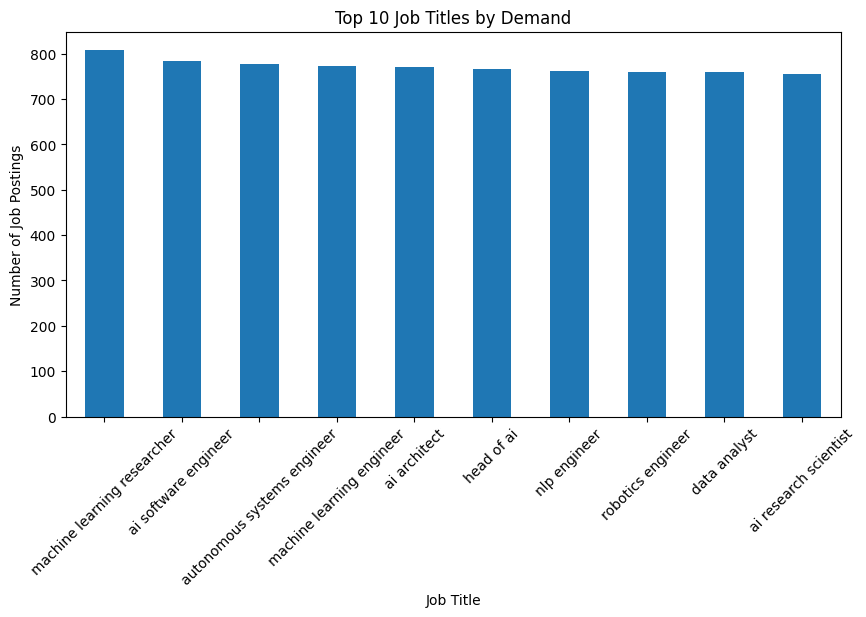

In [ ]:
# Count job titles
top_jobs = df['job_title'].value_counts().head(10)

# Plot
plt.figure(figsize=(10,5))
top_jobs.plot(kind='bar')
plt.title("Top 10 Job Titles by Demand")
plt.xlabel("Job Title")
plt.ylabel("Number of Job Postings")
plt.xticks(rotation=45)
plt.show()

The above part is not good so wrote another code for Visualization.

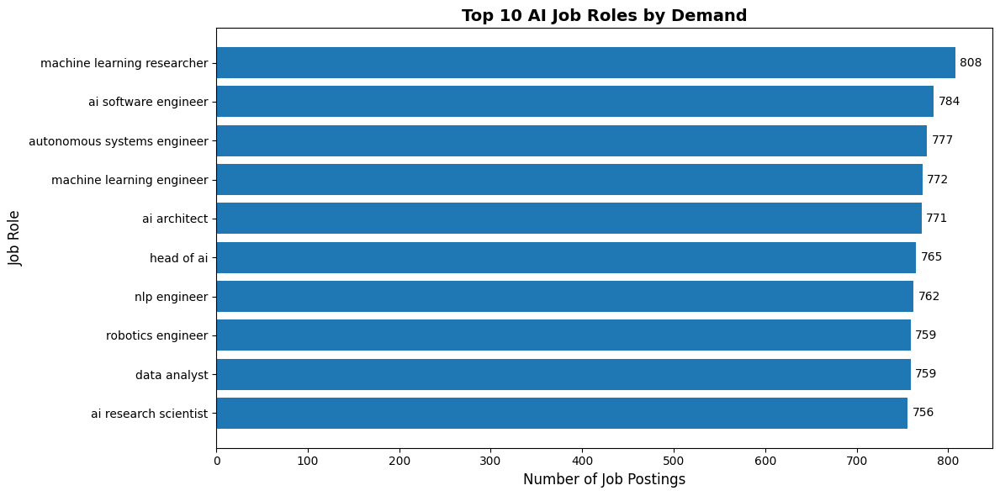

In [ ]:
# Top job titles
top_jobs = df['job_title'].value_counts().head(10)

plt.figure(figsize=(12,6))

bars = plt.barh(
    top_jobs.index[::-1],
    top_jobs.values[::-1]
)

# Add value labels
for bar in bars:
    plt.text(
        bar.get_width() + 5,
        bar.get_y() + bar.get_height()/2,
        int(bar.get_width()),
        va='center'
    )

plt.title("Top 10 AI Job Roles by Demand", fontsize=14, weight='bold')
plt.xlabel("Number of Job Postings", fontsize=12)
plt.ylabel("Job Role", fontsize=12)

plt.tight_layout()
plt.show()


Top countries Visualization

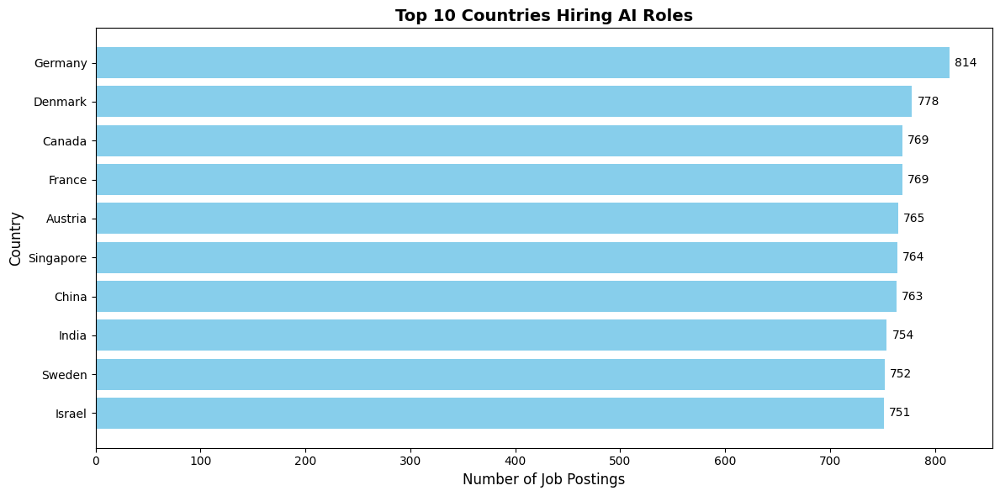

In [ ]:
# Top countries
top_countries = df['company_location'].value_counts().head(10)

plt.figure(figsize=(12,6))

bars = plt.barh(
    top_countries.index[::-1],
    top_countries.values[::-1],
    color='skyblue'
)

# Add value labels
for bar in bars:
    plt.text(
        bar.get_width() + 5,
        bar.get_y() + bar.get_height()/2,
        int(bar.get_width()),
        va='center'
    )

plt.title("Top 10 Countries Hiring AI Roles", fontsize=14, weight='bold')
plt.xlabel("Number of Job Postings", fontsize=12)
plt.ylabel("Country", fontsize=12)

plt.tight_layout()
plt.show()


Job trend Over Time(Single Job + Country)

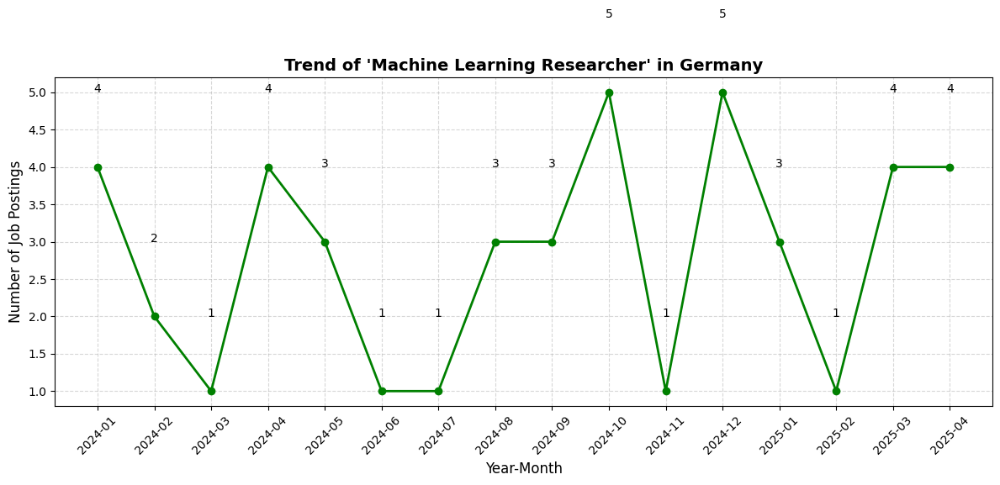

In [ ]:
# Select job title and country
job = "machine learning researcher"
country = "Germany"

# Filter dataset
filtered = df[
    (df['job_title'] == job) &
    (df['company_location'] == country)
]

# Aggregate monthly job counts
trend = filtered.groupby('year_month').size()

# Plot
plt.figure(figsize=(12,6))
plt.plot(trend.index, trend.values, marker='o', linestyle='-', color='green', linewidth=2)

# Add value labels
for i, v in enumerate(trend.values):
    plt.text(i, v + 1, str(v), ha='center', fontsize=10)

plt.title(f"Trend of '{job.title()}' in {country}", fontsize=14, weight='bold')
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("Number of Job Postings", fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


Same job across multiple countries.

<Figure size 1200x600 with 0 Axes>

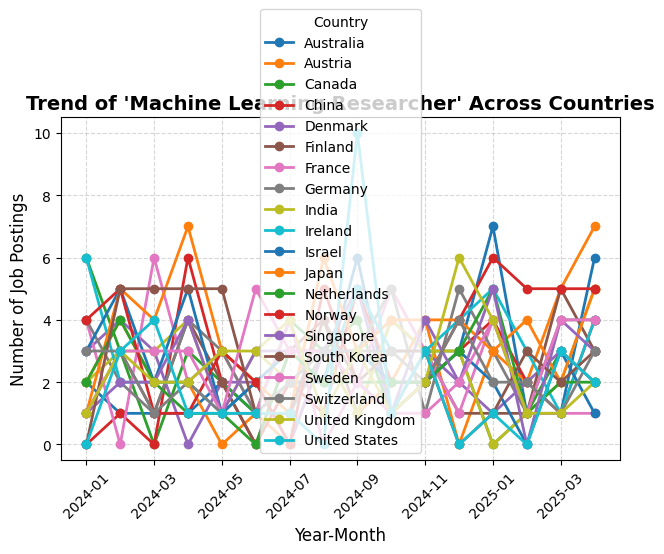

In [ ]:
# Select job title
job = "machine learning researcher"

# Filter dataset
multi = df[df['job_title'] == job]

# Aggregate monthly job counts by country
trend_multi = multi.groupby(['year_month', 'company_location']).size().unstack(fill_value=0)

# Plot
plt.figure(figsize=(12,6))
trend_multi.plot(marker='o', linewidth=2)
plt.title(f"Trend of '{job.title()}' Across Countries", fontsize=14, weight='bold')
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("Number of Job Postings", fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='Country')
plt.tight_layout()
plt.show()


The plot is not good so wrote some other plot.

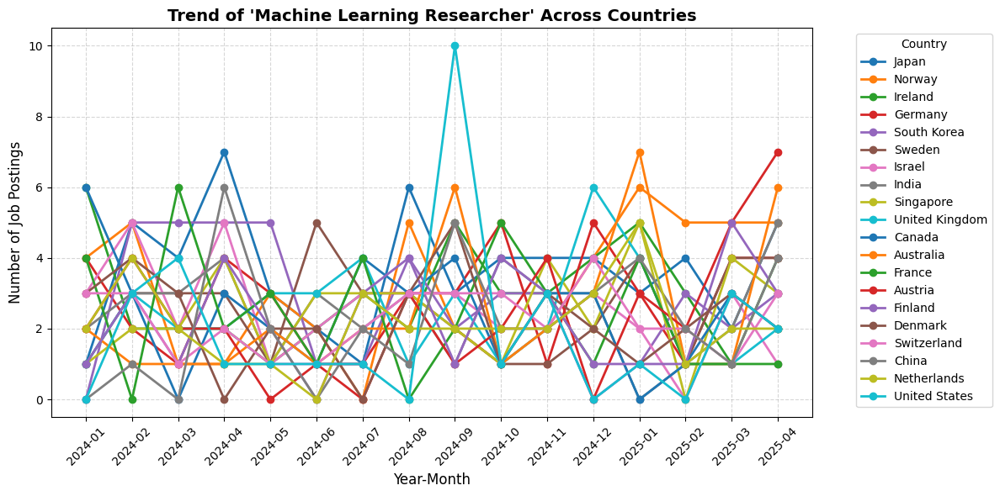

In [ ]:
job = "machine learning researcher"

# Filter dataset
multi = df[df['job_title'] == job]

# Aggregate monthly job counts by country
trend_multi = multi.groupby(['year_month', 'company_location']).size().unstack(fill_value=0)

# Sort countries by total job postings (optional)
trend_multi = trend_multi[trend_multi.sum().sort_values(ascending=False).index]

# Plot manually for better control
plt.figure(figsize=(12,6))

for country in trend_multi.columns:
    plt.plot(
        trend_multi.index,
        trend_multi[country],
        marker='o',
        linewidth=2,
        label=country
    )

plt.title(f"Trend of '{job.title()}' Across Countries", fontsize=14, weight='bold')
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("Number of Job Postings", fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')  # legend outside plot
plt.tight_layout()
plt.show()


/tmp/ipython-input-3412654893.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', num_countries)  # up to 20 distinct colors


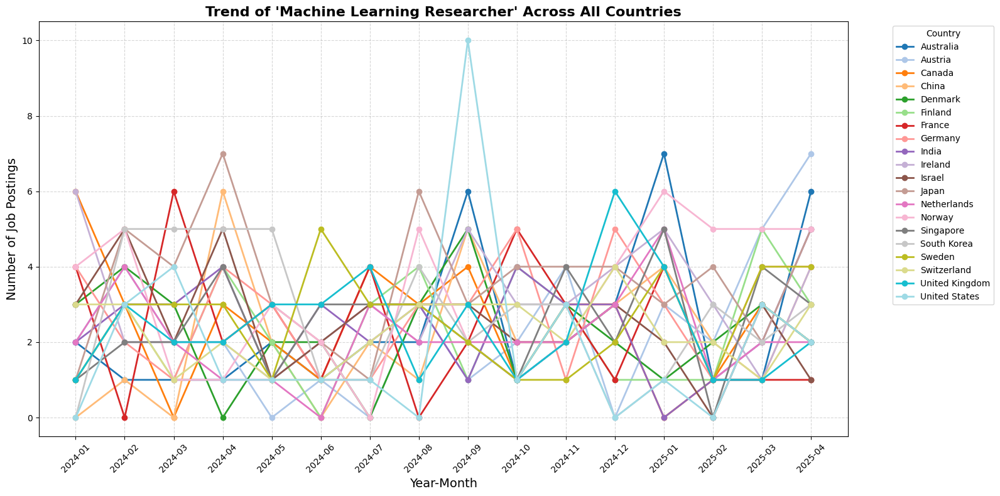

In [ ]:
import matplotlib.cm as cm
import numpy as np

job = "machine learning researcher"

# Filter dataset
multi = df[df['job_title'] == job]

# Aggregate monthly job counts by country
trend_multi = multi.groupby(['year_month', 'company_location']).size().unstack(fill_value=0)

# Automatically assign colors for all countries
num_countries = len(trend_multi.columns)
colors = cm.get_cmap('tab20', num_countries)  # up to 20 distinct colors

plt.figure(figsize=(16,8))

for i, country in enumerate(trend_multi.columns):
    plt.plot(
        trend_multi.index,
        trend_multi[country],
        marker='o',
        linewidth=2,
        label=country,
        color=colors(i % 20)  # repeat colormap if >20 countries
    )

plt.title(f"Trend of '{job.title()}' Across All Countries", fontsize=16, weight='bold')
plt.xlabel("Year-Month", fontsize=14)
plt.ylabel("Number of Job Postings", fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

# Place legend outside and make scrollable if too many countries
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()


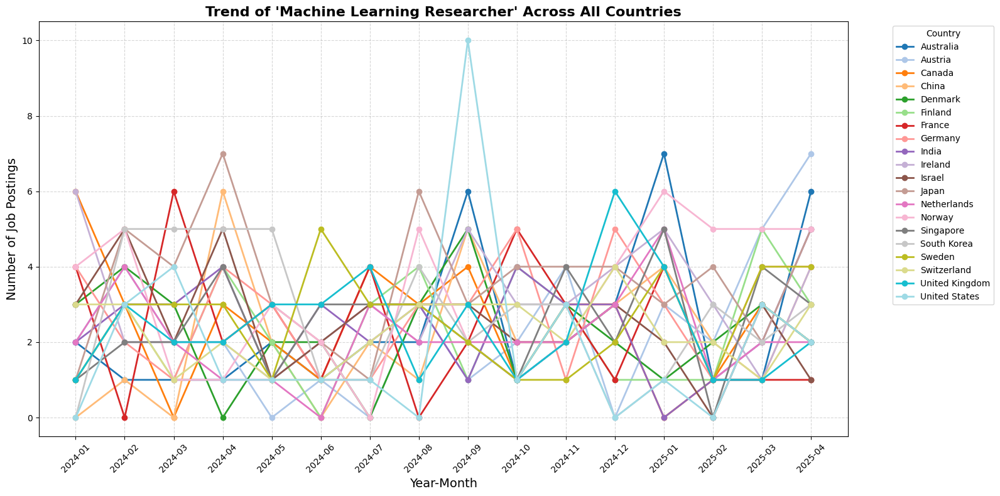

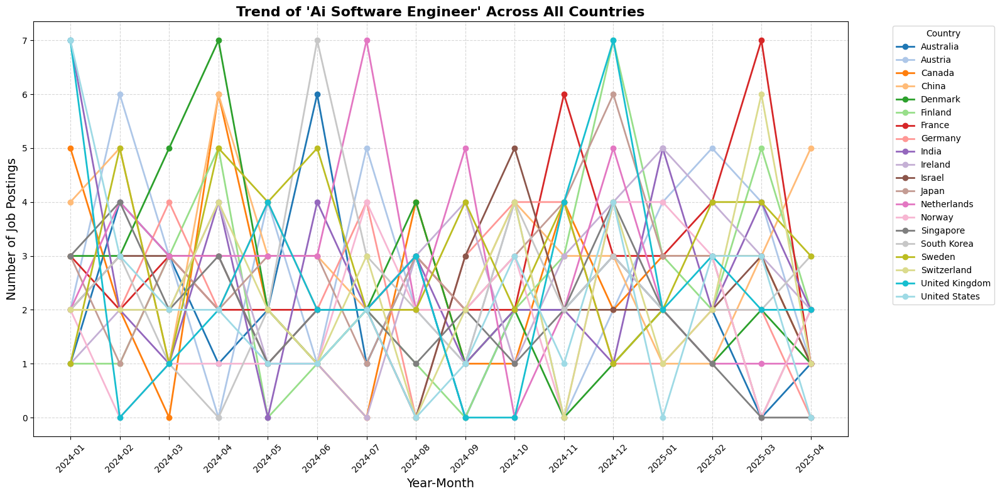

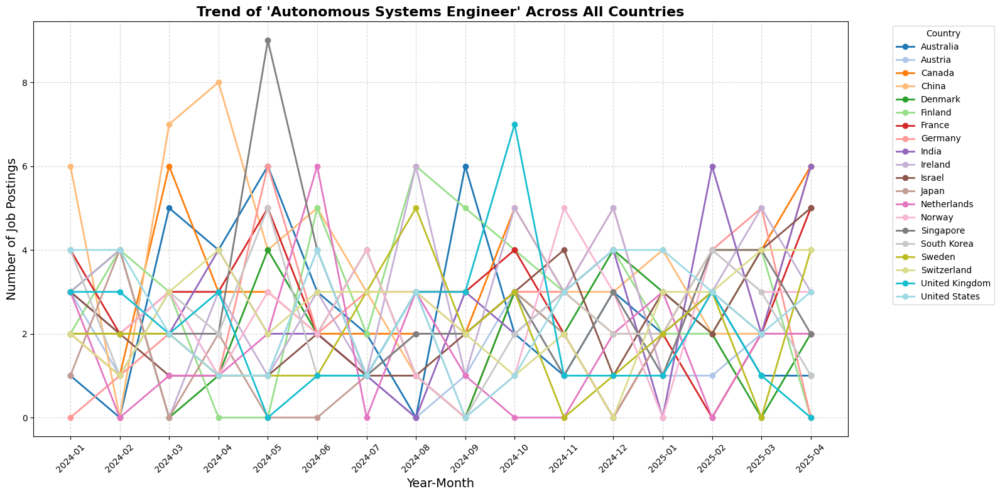

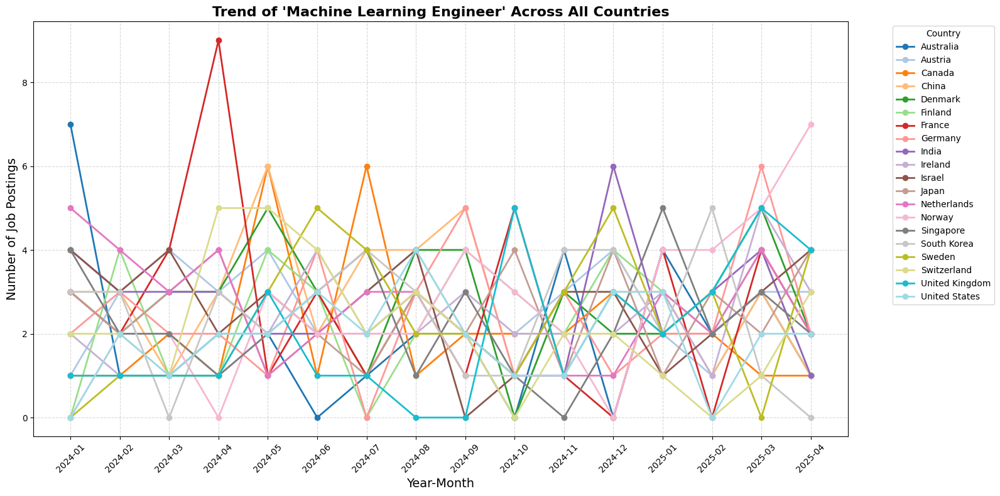

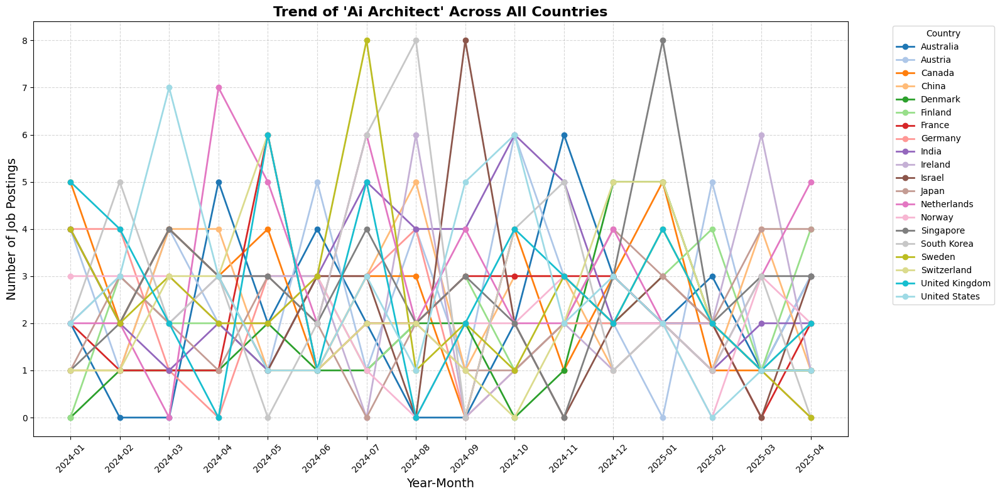

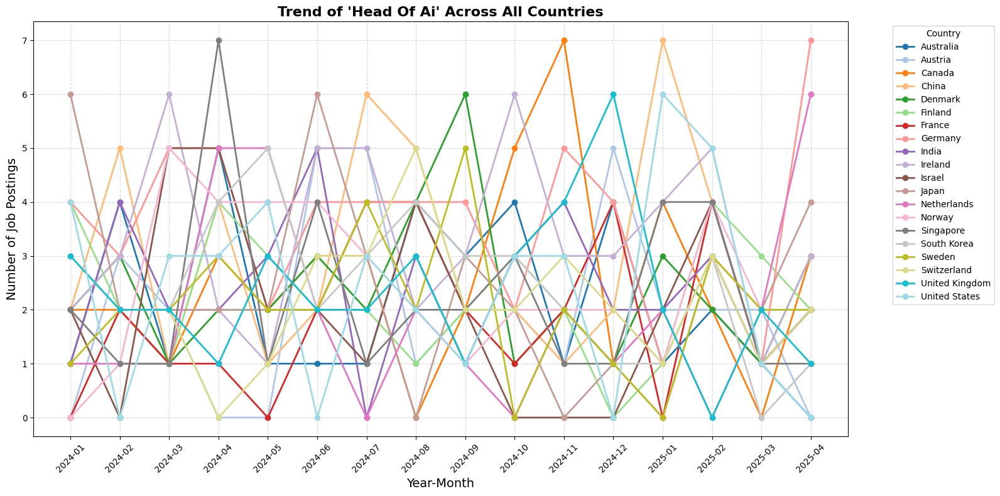

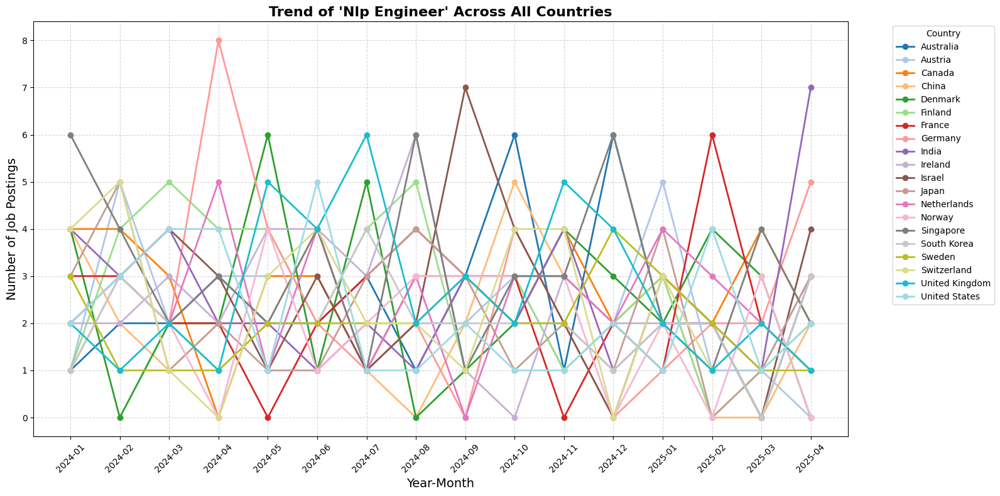

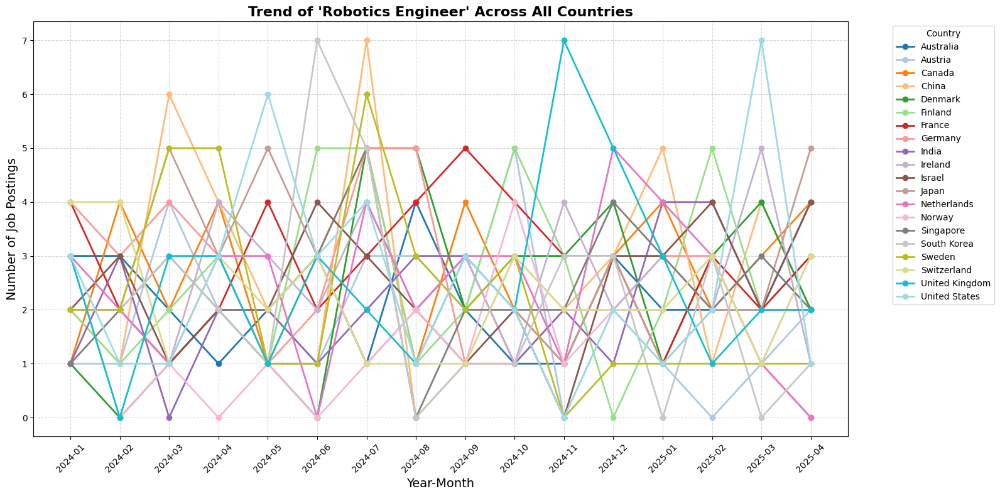

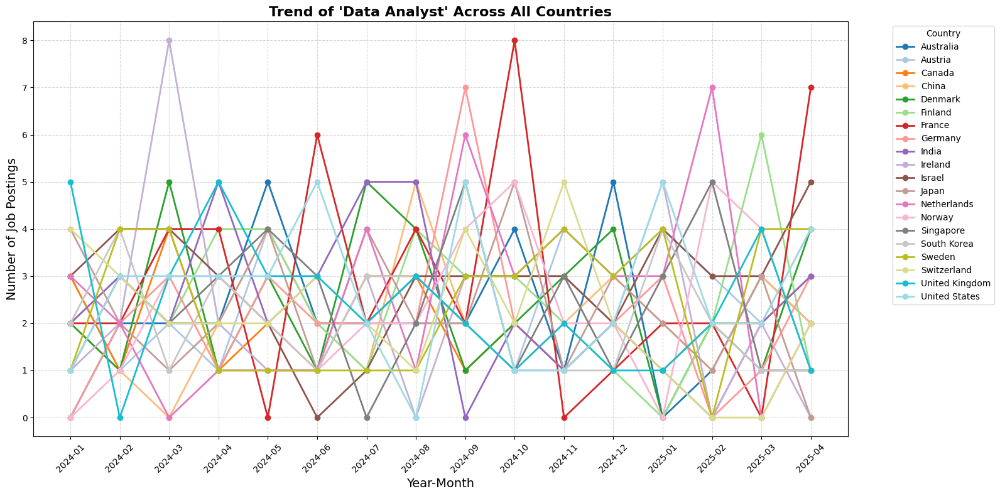

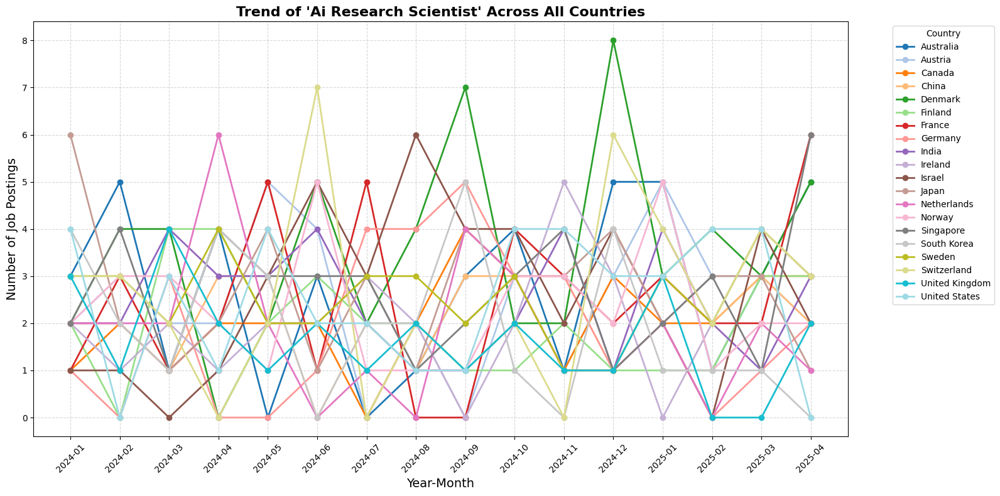

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Top 10 jobs
top_jobs = df['job_title'].value_counts().head(10).index

for job in top_jobs:
    multi = df[df['job_title'] == job]
    trend_multi = multi.groupby(['year_month', 'company_location']).size().unstack(fill_value=0)

    num_countries = len(trend_multi.columns)

    # Get colormap (new syntax)
    cmap = plt.colormaps['tab20']  # just get colormap
    colors = [cmap(i / max(1, num_countries-1)) for i in range(num_countries)]  # scale colors

    plt.figure(figsize=(16,8))
    for i, country in enumerate(trend_multi.columns):
        plt.plot(
            trend_multi.index,
            trend_multi[country],
            marker='o',
            linewidth=2,
            label=country,
            color=colors[i]
        )

    plt.title(f"Trend of '{job.title()}' Across All Countries", fontsize=16, weight='bold')
    plt.xlabel("Year-Month", fontsize=14)
    plt.ylabel("Number of Job Postings", fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.tight_layout()
    plt.show()


Changed to dark mode for better understanding.

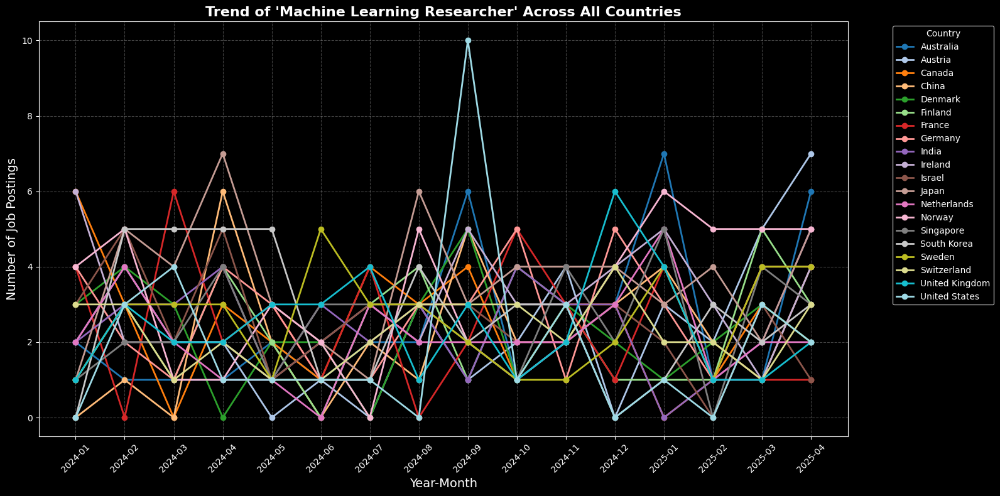

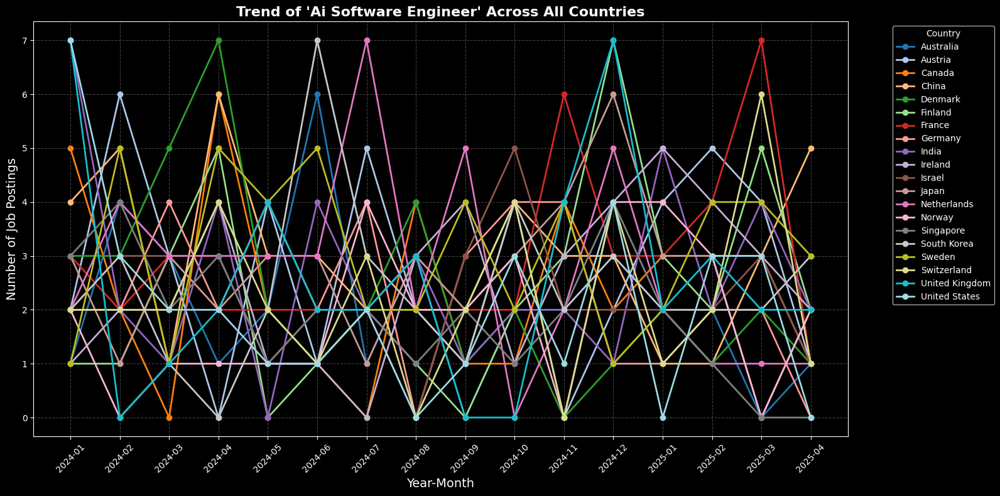

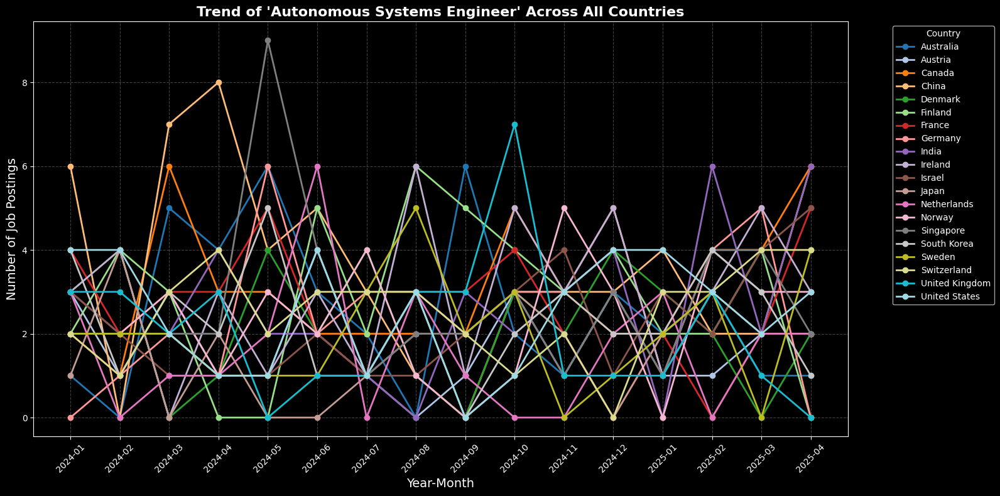

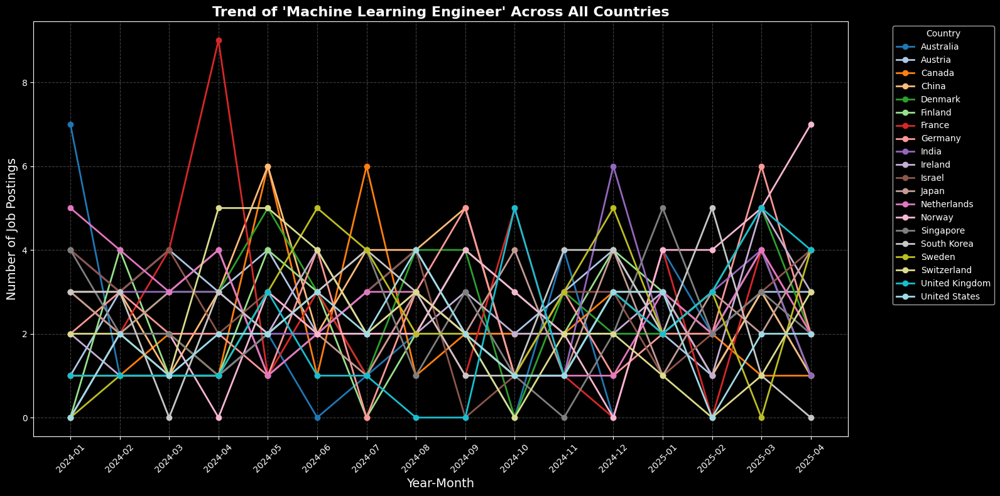

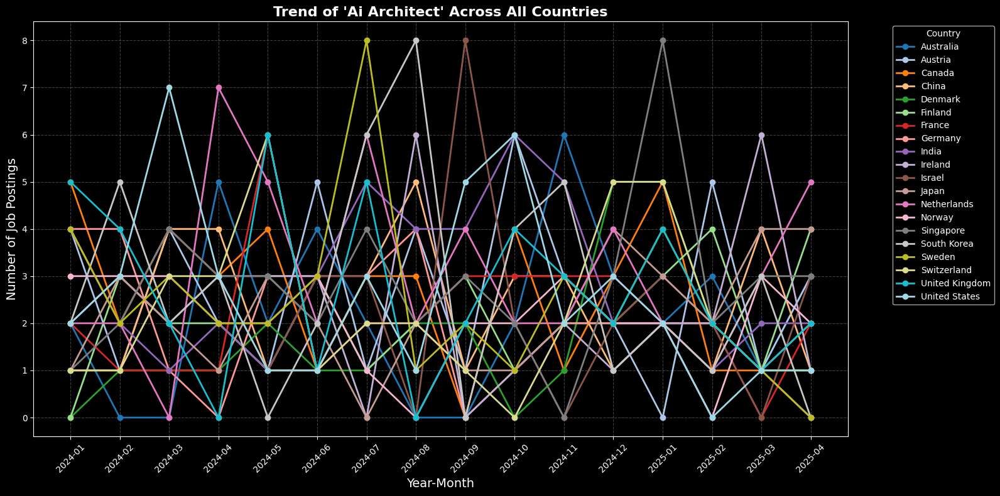

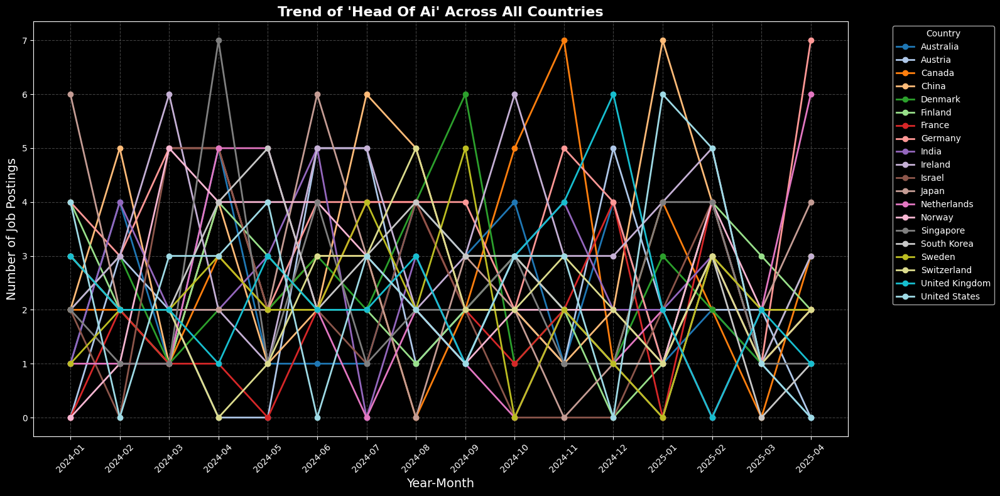

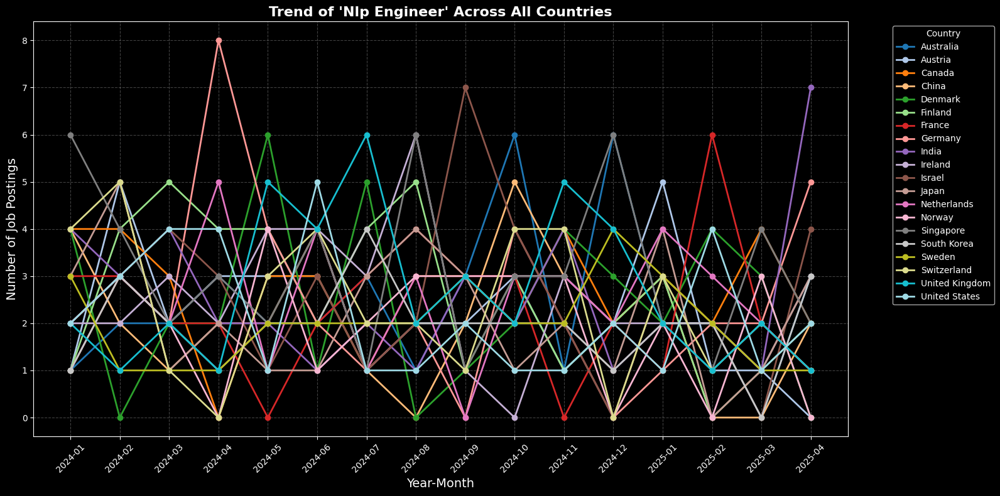

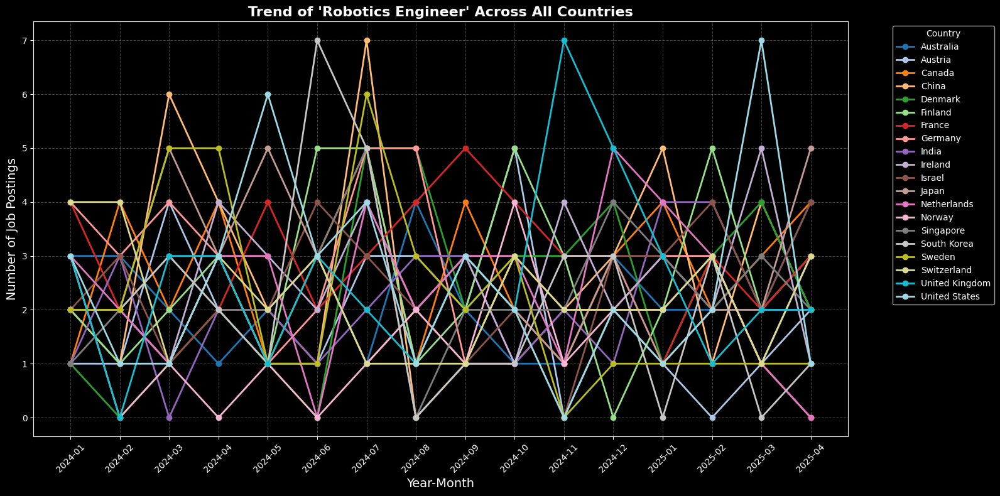

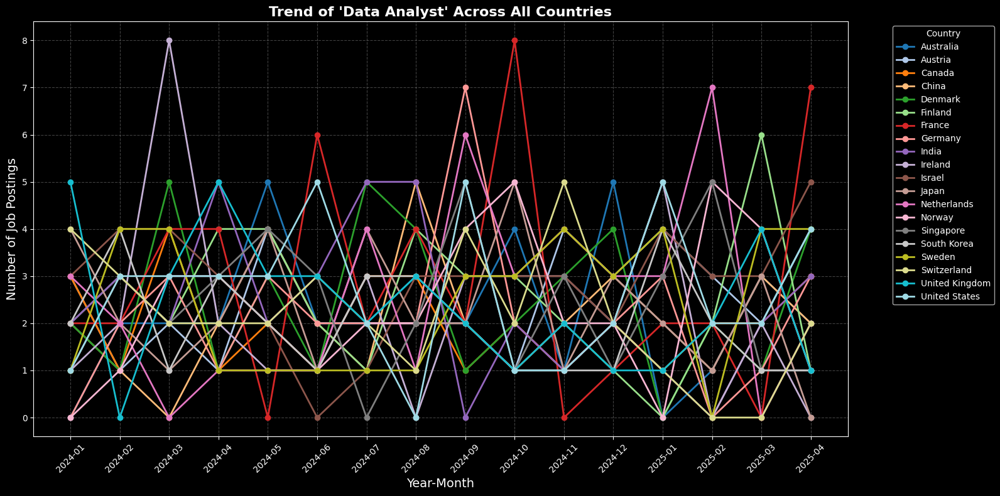

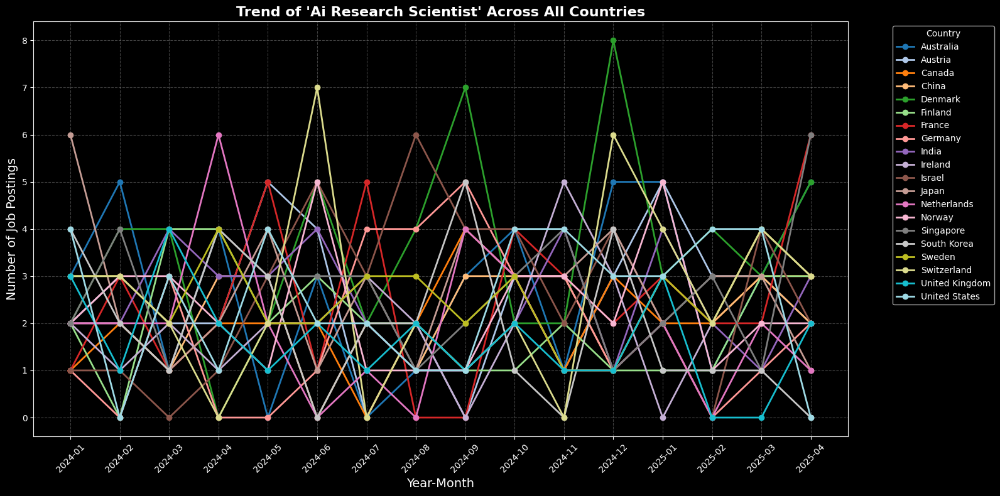

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Set dark background
plt.style.use('dark_background')

# Top 10 jobs
top_jobs = df['job_title'].value_counts().head(10).index

for job in top_jobs:
    multi = df[df['job_title'] == job]
    trend_multi = multi.groupby(['year_month', 'company_location']).size().unstack(fill_value=0)

    num_countries = len(trend_multi.columns)
    cmap = plt.colormaps['tab20']  # color map
    colors = [cmap(i / max(1, num_countries-1)) for i in range(num_countries)]

    plt.figure(figsize=(16,8))
    for i, country in enumerate(trend_multi.columns):
        plt.plot(
            trend_multi.index,
            trend_multi[country],
            marker='o',
            linewidth=2,
            label=country,
            color=colors[i]
        )

    plt.title(f"Trend of '{job.title()}' Across All Countries", fontsize=16, weight='bold', color='white')
    plt.xlabel("Year-Month", fontsize=14, color='white')
    plt.ylabel("Number of Job Postings", fontsize=14, color='white')
    plt.xticks(rotation=45, color='white')
    plt.yticks(color='white')
    plt.grid(True, linestyle='--', alpha=0.5, color='gray')
    plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.tight_layout()
    plt.show()


Average Salary by job title.

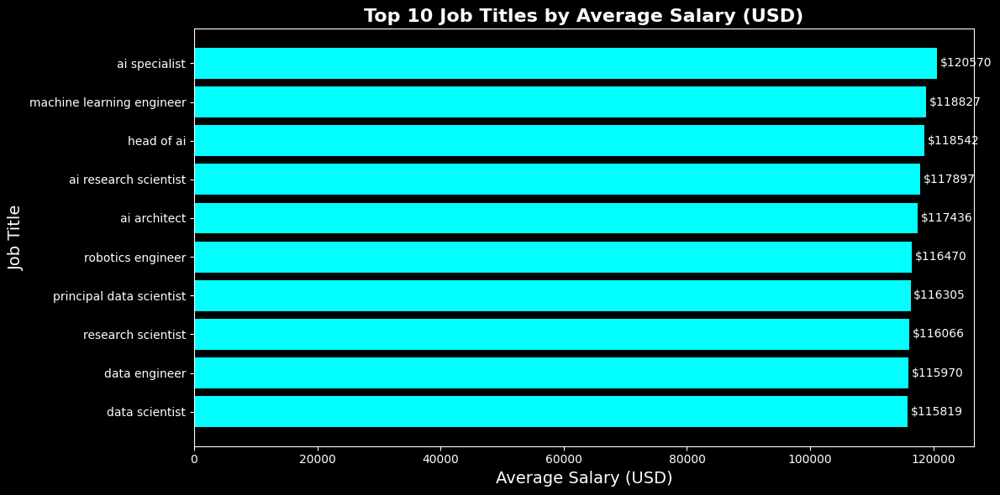

In [ ]:
# Use dark mode style for consistency
plt.style.use('dark_background')

# Average salary per job title
salary_job = df.groupby('job_title')['salary_usd'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))
bars = plt.barh(salary_job.index[::-1], salary_job.values[::-1], color='cyan')

# Add value labels
for bar in bars:
    plt.text(bar.get_width() + 500, bar.get_y() + bar.get_height()/2,
             f"${int(bar.get_width())}", va='center', color='white', fontsize=10)

plt.title("Top 10 Job Titles by Average Salary (USD)", fontsize=16, weight='bold', color='white')
plt.xlabel("Average Salary (USD)", fontsize=14, color='white')
plt.ylabel("Job Title", fontsize=14, color='white')
plt.tight_layout()
plt.show()


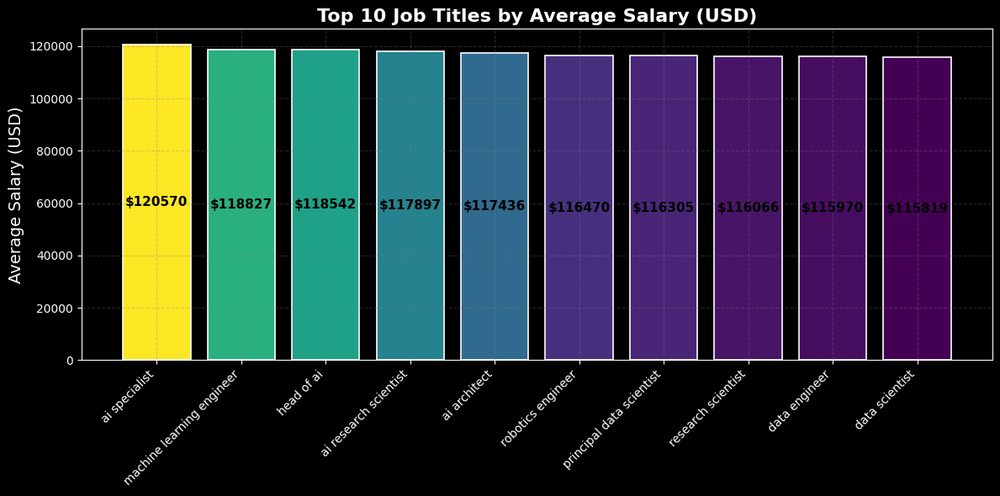

In [ ]:
plt.style.use('dark_background')

# Top 10 jobs by average salary
salary_job = df.groupby('job_title')['salary_usd'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))

# Color gradient: higher salary = brighter cyan
norm = plt.Normalize(salary_job.values.min(), salary_job.values.max())
colors = plt.cm.viridis(norm(salary_job.values))

bars = plt.bar(salary_job.index, salary_job.values, color=colors, edgecolor='white', linewidth=1.2)

# Add value labels inside bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height/2,
             f"${int(height)}", ha='center', va='center', color='black', fontsize=11, weight='bold')

plt.title("Top 10 Job Titles by Average Salary (USD)", fontsize=16, weight='bold', color='white')
plt.ylabel("Average Salary (USD)", fontsize=14, color='white')
plt.xticks(rotation=45, ha='right', color='white')
plt.yticks(color='white')
plt.grid(True, linestyle='--', alpha=0.3, color='gray')
plt.tight_layout()
plt.show()


Additional metrics.

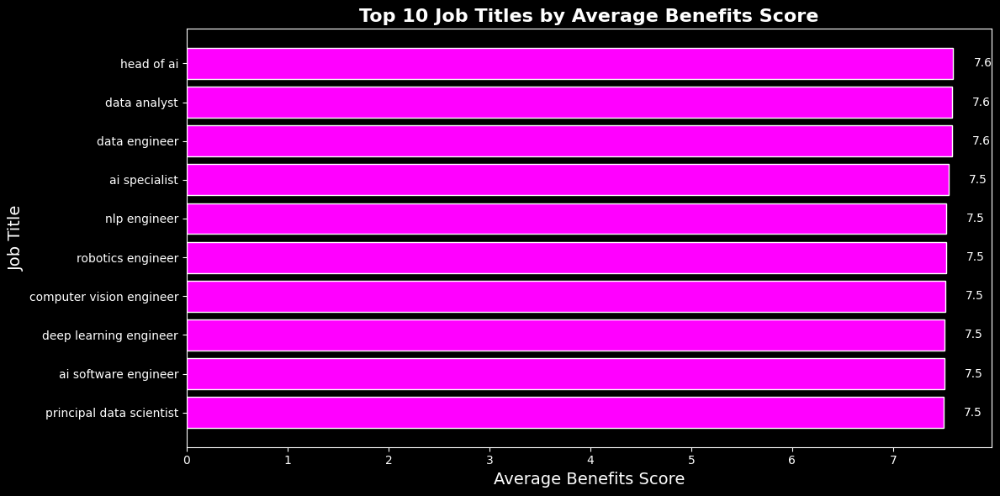

In [ ]:
plt.style.use('dark_background')

benefits_job = df.groupby('job_title')['benefits_score'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))
bars = plt.barh(benefits_job.index[::-1], benefits_job.values[::-1], color='magenta', edgecolor='white')

# Add labels
for bar in bars:
    plt.text(bar.get_width() + 0.2, bar.get_y() + bar.get_height()/2,
             f"{bar.get_width():.1f}", va='center', color='white', fontsize=10)

plt.title("Top 10 Job Titles by Average Benefits Score", fontsize=16, weight='bold', color='white')
plt.xlabel("Average Benefits Score", fontsize=14, color='white')
plt.ylabel("Job Title", fontsize=14, color='white')
plt.tight_layout()
plt.show()


Remote radio Distribution.

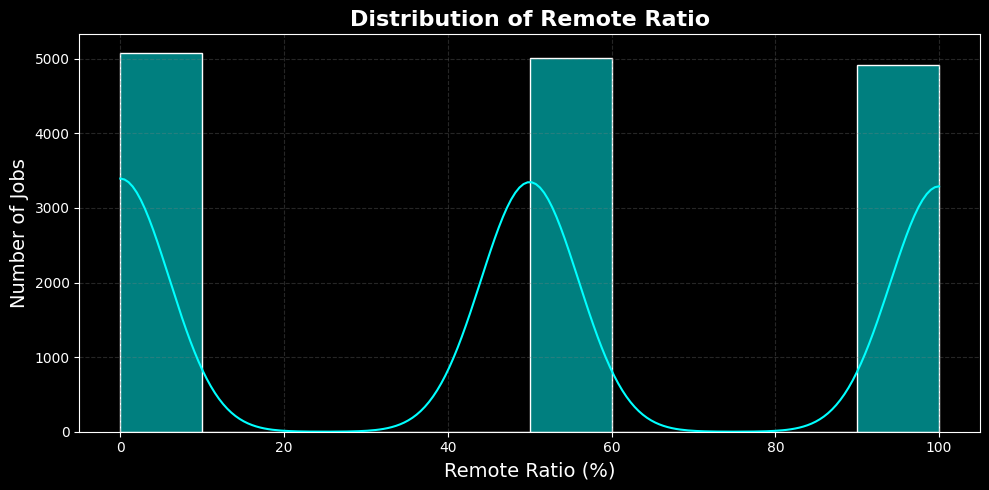

In [ ]:
plt.figure(figsize=(10,5))
sns.histplot(df['remote_ratio'], bins=10, kde=True, color='cyan')
plt.title("Distribution of Remote Ratio", fontsize=16, weight='bold', color='white')
plt.xlabel("Remote Ratio (%)", fontsize=14, color='white')
plt.ylabel("Number of Jobs", fontsize=14, color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.grid(True, linestyle='--', alpha=0.3, color='gray')
plt.tight_layout()
plt.show()


Data prep for job trend prediction (Mode Aggregation).

In [8]:
# Ensure posting_date is datetime
df['posting_date'] = pd.to_datetime(df['posting_date'], errors='coerce')

# Create year_month
df['year_month'] = df['posting_date'].dt.to_period('M').astype(str)

# Aggregate numeric + categorical features
agg_df = df.groupby(['year_month','job_title','company_location']).agg({
    'salary_usd':'mean',
    'remote_ratio':'mean',
    'job_description_length':'mean',
    'benefits_score':'mean',
    'experience_level': lambda x: x.mode()[0],   # most common
    'employment_type': lambda x: x.mode()[0],
    'company_size': lambda x: x.mode()[0],
    'education_required': lambda x: x.mode()[0],
    'industry': lambda x: x.mode()[0]
}).reset_index()

# Target: number of job postings in that month for that job+country
agg_df['job_count'] = df.groupby(['year_month','job_title','company_location']).size().values

agg_df.head()


,year_month,job_title,company_location,salary_usd,remote_ratio,job_description_length,benefits_score,experience_level,employment_type,company_size,education_required,industry,job_count
0,2024-01,AI Architect,Australia,213490.50,50.0,1780.00,6.900,EX,CT,L,Master,Education,2
1,2024-01,AI Architect,Austria,80915.75,75.0,1860.25,6.925,SE,PT,S,Associate,Media,4
2,2024-01,AI Architect,Canada,130617.40,70.0,1836.20,7.920,EX,PT,M,Associate,Government,5
3,2024-01,AI Architect,China,50420.00,0.0,1912.00,8.900,EN,FT,L,Associate,Energy,1
4,2024-01,AI Architect,France,95476.00,100.0,1196.50,6.500,EN,CT,L,Associate,Energy,2


Encode Categorical Variables.

In [9]:
from sklearn.preprocessing import LabelEncoder

categorical_cols = ['job_title','company_location','experience_level',
                    'employment_type','company_size','education_required','industry']

for col in categorical_cols:
    le = LabelEncoder()
    agg_df[col] = le.fit_transform(agg_df[col])

Prepare Features (X) and Target (y).

In [10]:
X = agg_df.drop(columns=['job_count','year_month'])
y = agg_df['job_count']

print("Features shape:", X.shape)
print("Target shape:", y.shape)
X.head()


Features shape: (5808, 11)
Target shape: (5808,)


,job_title,company_location,salary_usd,remote_ratio,job_description_length,benefits_score,experience_level,employment_type,company_size,education_required,industry
0,0,0,213490.50,50.0,1780.00,6.900,1,0,0,2,2
1,0,1,80915.75,75.0,1860.25,6.925,3,3,2,0,9
2,0,2,130617.40,70.0,1836.20,7.920,1,3,1,0,6
3,0,3,50420.00,0.0,1912.00,8.900,0,2,0,0,3
4,0,6,95476.00,100.0,1196.50,6.500,0,0,0,0,3


Running baseline ML models.

In [11]:
# Train/Test Split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [12]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pickle

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42)
}

# Train, predict and evaluate
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))  # manual RMSE
    r2 = r2_score(y_test, y_pred)

    print(f"{name} => RMSE: {rmse:.2f}, R2: {r2:.2f}")

Linear Regression => RMSE: 1.35, R2: 0.04
Random Forest => RMSE: 0.82, R2: 0.65


Linear Regression Model vs Random forest model

In [13]:
# Save Best Model (Random Forest) as .pkl
best_model = models["Random Forest"]
with open("job_trend_model(Random Forest Model).pkl", "wb") as f:
    pickle.dump(best_model, f)

print("Random Forest model saved as 'job_trend_model.pkl'")

Random Forest model saved as 'job_trend_model.pkl'


Building a Linear Regression model.

In [19]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Linear Regression => RMSE:", round(rmse,2), "R2:", round(r2,2))

with open("job_trend_model(Linear_regression).pkl", "wb") as f:
    pickle.dump(lr, f)

Linear Regression => RMSE: 1.35 R2: 0.04


Building a Gradient boosting Model

In [20]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(
    n_estimators=150,
    learning_rate=0.05,
    random_state=42
)

gbr.fit(X_train, y_train)
y_pred = gbr.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Gradient Boosting => RMSE:", round(rmse,2), "R2:", round(r2,2))

with open("job_trend_model(Gradient_boosting).pkl", "wb") as f:
    pickle.dump(gbr, f)

Gradient Boosting => RMSE: 0.89 R2: 0.58


Building a Extra Tree regressor

In [22]:
from sklearn.ensemble import ExtraTreesRegressor

etr = ExtraTreesRegressor(
    n_estimators=200,
    random_state=42
)

etr.fit(X_train, y_train)
y_pred = etr.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Extra Trees => RMSE:", round(rmse,2), "R2:", round(r2,2))

with open("job_trend_model(Extra_trees).pkl", "wb") as f:
    pickle.dump(etr, f)

Extra Trees => RMSE: 0.83 R2: 0.64


Building a XGBoost regressor

In [23]:
!pip install xgboost


In [25]:
from xgboost import XGBRegressor

xgb = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("XGBoost => RMSE:", round(rmse,2), "R2:", round(r2,2))

with open("job_trend_model(XGBoost).pkl", "wb") as f:
    pickle.dump(xgb, f)

XGBoost => RMSE: 0.82 R2: 0.65


Building a LGBM regressor

In [26]:
!pip install lightgbm


In [28]:
import lightgbm as lgb

lgbm = lgb.LGBMRegressor(
    n_estimators=300,
    learning_rate=0.05,
    random_state=42,
    force_row_wise=True
)

lgbm.fit(X_train, y_train)
y_pred = lgbm.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("LightGBM => RMSE:", round(rmse,2), "R2:", round(r2,2))

with open("job_trend_model(Lightgbm).pkl", "wb") as f:
    pickle.dump(lgbm, f)

[LightGBM] [Info] Total Bins 845
[LightGBM] [Info] Number of data points in the train set: 4646, number of used features: 11
[LightGBM] [Info] Start training from score 2.575979
LightGBM => RMSE: 0.86 R2: 0.61


Now lets rank the models and See which model performs the best.

In [30]:
import pandas as pd

model_results = [
    {"Model": "Linear Regression", "RMSE": 1.35, "R2": 0.04},
    {"Model": "Random Forest", "RMSE": 0.82, "R2": 0.65},
    {"Model": "Gradient Boosting", "RMSE": 0.89, "R2": 0.58},
    {"Model": "Extra Trees", "RMSE": 0.83, "R2": 0.64},
    {"Model": "XGBoost", "RMSE": 0.82, "R2": 0.65},
    {"Model": "LightGBM", "RMSE": 0.86, "R2": 0.61},
]

df = pd.DataFrame(model_results)

# Ranking logic
df["RMSE_rank"] = df["RMSE"].rank(ascending=True)
df["R2_rank"] = df["R2"].rank(ascending=False)
df["Final_score"] = df["RMSE_rank"] + df["R2_rank"]

# Sort by best score
df = df.sort_values("Final_score").reset_index(drop=True)

# Display clean table
display(df[["Model", "RMSE", "R2", "Final_score"]])

,Model,RMSE,R2,Final_score
0,Random Forest,0.82,0.65,3.0
1,XGBoost,0.82,0.65,3.0
2,Extra Trees,0.83,0.64,6.0
3,LightGBM,0.86,0.61,8.0
4,Gradient Boosting,0.89,0.58,10.0
5,Linear Regression,1.35,0.04,12.0


Based on the scores, We can use Random forest as the main model, since it gives the best predictions, and XGBoost can be a secondary option(Why are we using Random forest as the main model because it is simpler,faster and easier to implement whereas XGBoost is more complex and Slower to train).